<a href="https://colab.research.google.com/github/zey19/DataAugmentationAndObjectDetection/blob/main/DataAugAndObjDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PART 1 (Data Augmentation and Bounding Boxes)

## In this notebook we will examine the data augmentation techniques and combine them with object detection algortihm on wheat images.
### We are going to use predefined dataset from Kaggle in order to connect to the kaggle we will install and make necessary configurations with below commands.

In [ ]:
! pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
! mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle competitions download global-wheat-detection

 99% 604M/607M [00:16<00:00, 39.7MB/s]
100% 607M/607M [00:16<00:00, 38.0MB/s]


In [ ]:
! unzip global-wheat-detection

Archive:  global-wheat-detection.zip
  inflating: sample_submission.csv   
  inflating: test/2fd875eaa.jpg      
  inflating: test/348a992bb.jpg      
  inflating: test/51b3e36ab.jpg      
  inflating: test/51f1be19e.jpg      
  inflating: test/53f253011.jpg      
  inflating: test/796707dd7.jpg      
  inflating: test/aac893a91.jpg      
  inflating: test/cb8d261a3.jpg      
  inflating: test/cc3532ff6.jpg      
  inflating: test/f5a1f0358.jpg      
  inflating: train.csv               
  inflating: train/00333207f.jpg     
  inflating: train/005b0d8bb.jpg     
  inflating: train/006a994f7.jpg     
  inflating: train/00764ad5d.jpg     
  inflating: train/00b5c6764.jpg     
  inflating: train/00b5fefed.jpg     
  inflating: train/00b70a919.jpg     
  inflating: train/00e903abe.jpg     
  inflating: train/00ea5e5ee.jpg     
  inflating: train/010b216d4.jpg     
  inflating: train/010c93b99.jpg     
  inflating: train/010dbcc8f.jpg     
  inflating: train/0114c88aa.jpg     
  inflating: 

In [ ]:
import os
import re
import cv2
import ast
import random
import pandas as pd
import numpy as np

from PIL import Image
import albumentations as A
from collections import namedtuple
from albumentations.pytorch.transforms import ToTensorV2

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from pathlib import Path



In [ ]:
base_dir = Path('/content')
train_dir = base_dir/'train'

In [ ]:
def load_data():
    train_df = pd.read_csv('train.csv')
    bboxes = np.stack(train_df['bbox'].apply(lambda x: ast.literal_eval(x)))
    for i, col in enumerate(['x_min', 'y_min', 'w', 'h']):
        train_df[col] = bboxes[:, i]

    train_df["x_max"] = train_df.apply(lambda col: col.x_min + col.w, axis=1)
    train_df["y_max"] = train_df.apply(lambda col: col.y_min + col.h, axis = 1)
    train_df.drop(['bbox', 'w', 'h'], axis=1, inplace=True)
    print('DataFrame size: ',train_df.shape)
    return train_df

In [ ]:
df = load_data()
df.head()

DataFrame size:  (147793, 8)


,image_id,width,height,source,x_min,y_min,x_max,y_max
0,b6ab77fd7,1024,1024,usask_1,834.0,222.0,890.0,258.0
1,b6ab77fd7,1024,1024,usask_1,226.0,548.0,356.0,606.0
2,b6ab77fd7,1024,1024,usask_1,377.0,504.0,451.0,664.0
3,b6ab77fd7,1024,1024,usask_1,834.0,95.0,943.0,202.0
4,b6ab77fd7,1024,1024,usask_1,26.0,144.0,150.0,261.0


### We will implement some helper functions.

In [ ]:
def draw_rect(img, bboxes, color=(255, 0, 0)):
    img = img.copy()
    for bbox in bboxes:
        bbox = np.array(bbox).astype(int)
        pt1, pt2 = (bbox[0], bbox[1]), (bbox[2], bbox[3])
        img = cv2.rectangle(img, pt1, pt2, color, int(max(img.shape[:2]) / 200))
    return img

def read_img(img_id):
    img_path = train_dir/f'{img_id}.jpg'
    print(str(img_path))
    img = cv2.imread(str(img_path))
    return img

def read_bboxes(img_id):
    return df.loc[df.image_id == img_id, 'x_min y_min x_max y_max'.split()].values
def plot_img(img_id, bbox=False):
    img    = read_img(img_id)
    if bbox:
        bboxes = read_bboxes(img_id)
        img    = draw_rect(img, bboxes)
    plt.imshow(img);
    
def plot_multiple_img(img_matrix_list, title_list, ncols, nrows=3, main_title=""):
    fig, myaxes = plt.subplots(figsize=(20, 15), nrows=nrows, ncols=ncols, squeeze=False)
    fig.suptitle(main_title, fontsize = 30)
    fig.subplots_adjust(wspace=0.3)
    fig.subplots_adjust(hspace=0.3)
    for i, (img, title) in enumerate(zip(img_matrix_list, title_list)):
        
        myaxes[i // ncols][i % ncols].imshow(img)
        myaxes[i // ncols][i % ncols].set_title(title, fontsize=15)
        myaxes[i // ncols][i % ncols].grid(False)
        myaxes[i // ncols][i % ncols].set_xticks([])
        myaxes[i // ncols][i % ncols].set_yticks([])

    plt.show()

### Select some random image from dataset and apply augmentation techniques on the image. 

In [ ]:
img_id = '0b5b60131'


chosen_img = read_img(img_id)

/content/train/0b5b60131.jpg


### For augmentation we will use Albumenations library which is very easy to use. From [this link](https://albumentations.ai/docs/)  you can reach out the official site.

/content/train/0b5b60131.jpg


/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1613: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1639: FutureWarning: RandomContrast has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(


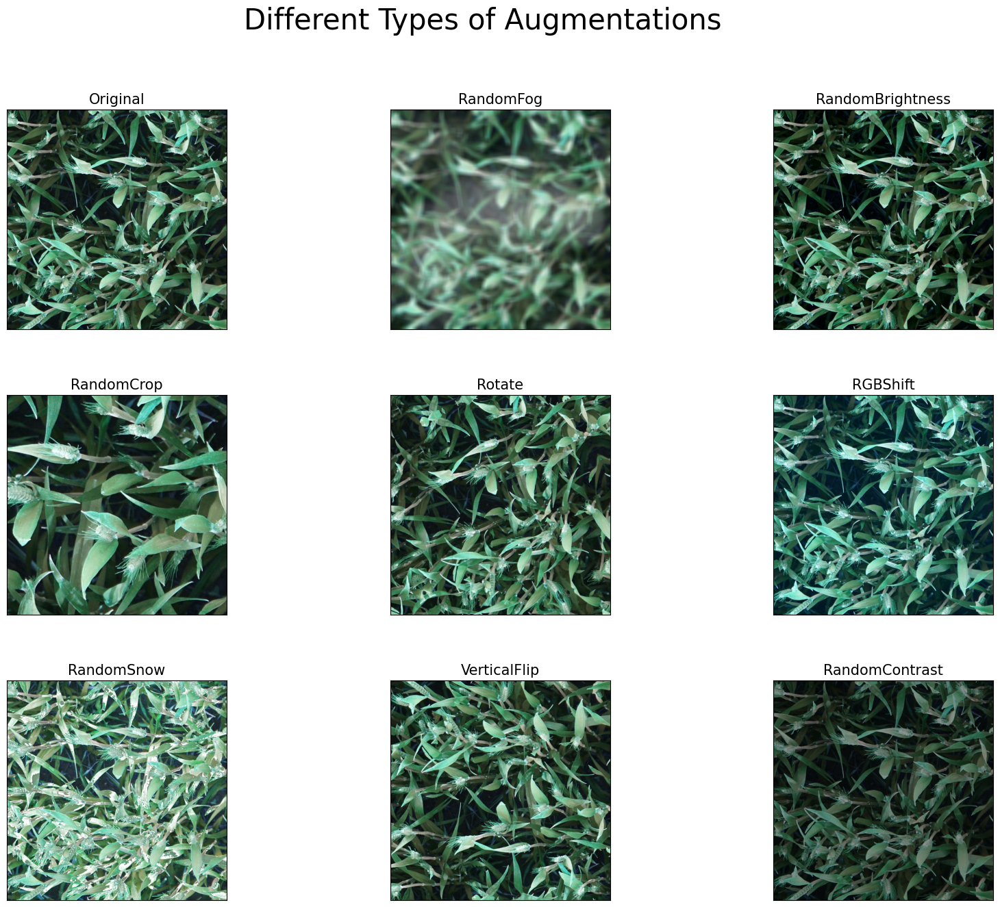

In [ ]:
chosen_img = read_img(img_id)

albumentation_list = [A.RandomFog(p=1), 
                      A.RandomBrightness(p=1), 
                      A.RandomCrop(p=1,height = 512, width = 512), 
                      A.Rotate(p=1, limit=90),
                      A.RGBShift(p=1), 
                      A.RandomSnow(p=1), 
                      A.VerticalFlip(p=1), 
                      A.RandomContrast(limit = 0.5,p = 1)]
                      
titles_list = ["Original", 
               "RandomFog",
               "RandomBrightness", 
               "RandomCrop",
               "Rotate", 
               "RGBShift", 
               "RandomSnow", 
               "VerticalFlip", 
               "RandomContrast"]

img_matrix_list = [chosen_img]
for aug_type in albumentation_list:
    img = aug_type(image = chosen_img)['image']
    img_matrix_list.append(img)

plot_multiple_img(img_matrix_list, 
                  titles_list, 
                  ncols = 3, 
                  main_title="Different Types of Augmentations")

### When you transform an image, the coordinates of bounding boxes are also altered. Apply same transformations to your image and bounding box is very sophisticated and prone to errors. Things get even more complex when you start chaining these transformations.
### Albumenations library automatically takes care of bboxes.

/content/train/0b5b60131.jpg


/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1613: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1639: FutureWarning: RandomContrast has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(


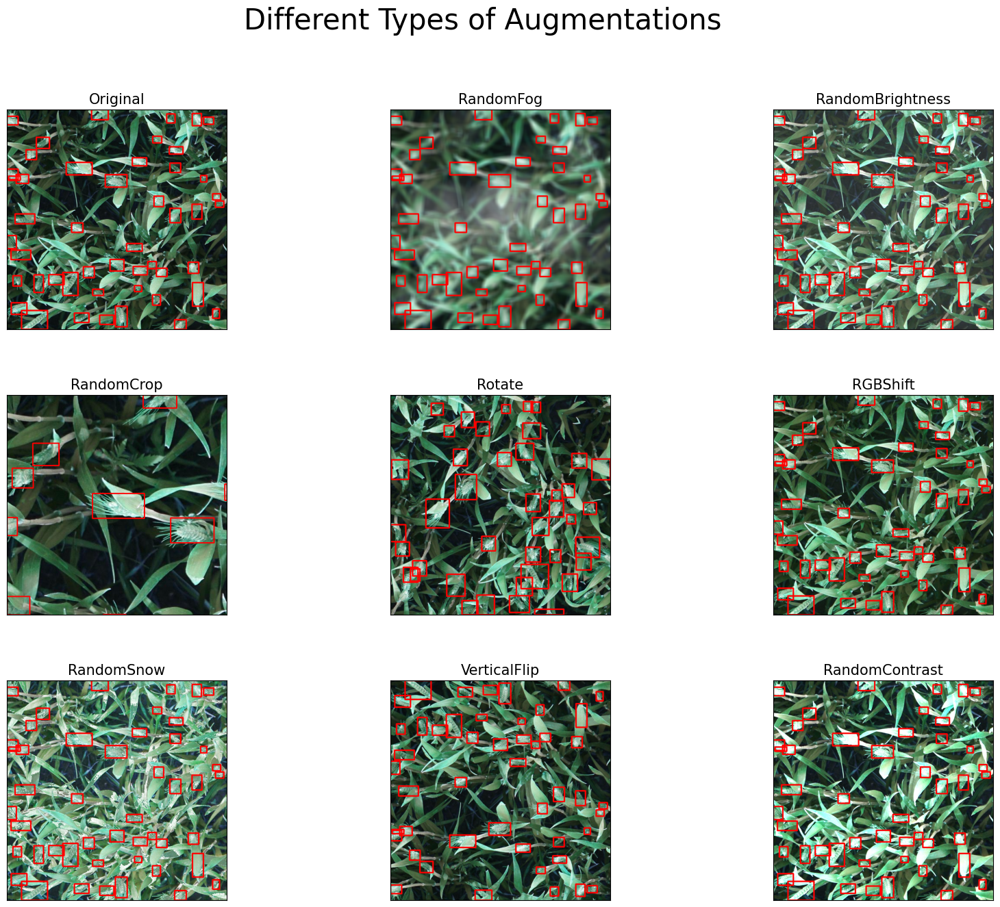

In [ ]:
chosen_img = read_img(img_id)
bboxes = read_bboxes(img_id)
bbox_params = {'format': 'pascal_voc', 'label_fields': ['labels']}

albumentation_list = [A.Compose([A.RandomFog(p=1)], bbox_params=bbox_params),
                      A.Compose([A.RandomBrightness(p=1)], bbox_params=bbox_params),
                      A.Compose([A.RandomCrop(p=1, height=512, width=512)], bbox_params=bbox_params), 
                      A.Compose([A.Rotate(p=1, limit=90)], bbox_params=bbox_params),
                      A.Compose([A.RGBShift(p=1)], bbox_params=bbox_params), 
                      A.Compose([A.RandomSnow(p=1)], bbox_params=bbox_params),
                      A.Compose([A.VerticalFlip(p=1)], bbox_params=bbox_params), 
                      A.Compose([A.RandomContrast(limit=0.5, p = 1)], bbox_params=bbox_params)
                     ]
titles_list = ["Original", 
               "RandomFog",
               "RandomBrightness", 
               "RandomCrop",
               "Rotate", 
               "RGBShift", 
               "RandomSnow", 
               "VerticalFlip", 
               "RandomContrast"]

img_matrix_list = [draw_rect(chosen_img, bboxes)]

for aug_type in albumentation_list:
    anno = aug_type(image=chosen_img, bboxes=bboxes, labels=np.ones(len(bboxes)))
    img  = draw_rect(anno['image'], anno['bboxes'])
    img_matrix_list.append(img)

plot_multiple_img(img_matrix_list, 
                  titles_list, 
                  ncols = 3, 
                  main_title="Different Types of Augmentations")

# As we can see the Albumenation library is very good at adjusting bboxes and data augmentation. For the future work, a neural network  fitted with the images can be test by the test set. In this part we only demonstrate how we can achieve the data augmentation and bboxes with a library.

# PART 2 Object Detection with YOLO and trying to detect new class which is flowers.

### In this lab section we are going to use YOLOv5 for object detection and train YOLOv5 with another class which is not pretrained before.
### Flowers can not be detected by YOLOv5 as we can see, so we try to train YOLO with flower data.

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5/
!pip install -r requirements.txt
!pip install wandb

Cloning into 'yolov5'...
remote: Enumerating objects: 15965, done.
remote: Counting objects: 100% (134/134), done.
remote: Compressing objects: 100% (62/62), done.
remote: Total 15965 (delta 83), reused 109 (delta 72), pack-reused 15831
Receiving objects: 100% (15965/15965), 14.60 MiB | 19.12 MiB/s, done.
Resolving deltas: 100% (10952/10952), done.
/content/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 593.1/593.1 kB 44.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.6 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 53.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.5/206.5 kB 23.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) .

In [ ]:
import torch
from IPython.display import Image

print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

torch 2.0.1+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


In [ ]:
!python detect.py --weights yolov5m.pt --img 640 --source data/images/bus.jpg

detect: weights=['yolov5m.pt'], source=data/images/bus.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-175-g5f11555 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

100% 40.8M/40.8M [00:01<00:00, 39.9MB/s]

Fusing layers... 
YOLOv5m summary: 290 layers, 21172173 parameters, 0 gradients
image 1/1 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, 53.6ms
Speed: 0.7ms pre-process, 53.6ms inference, 289.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


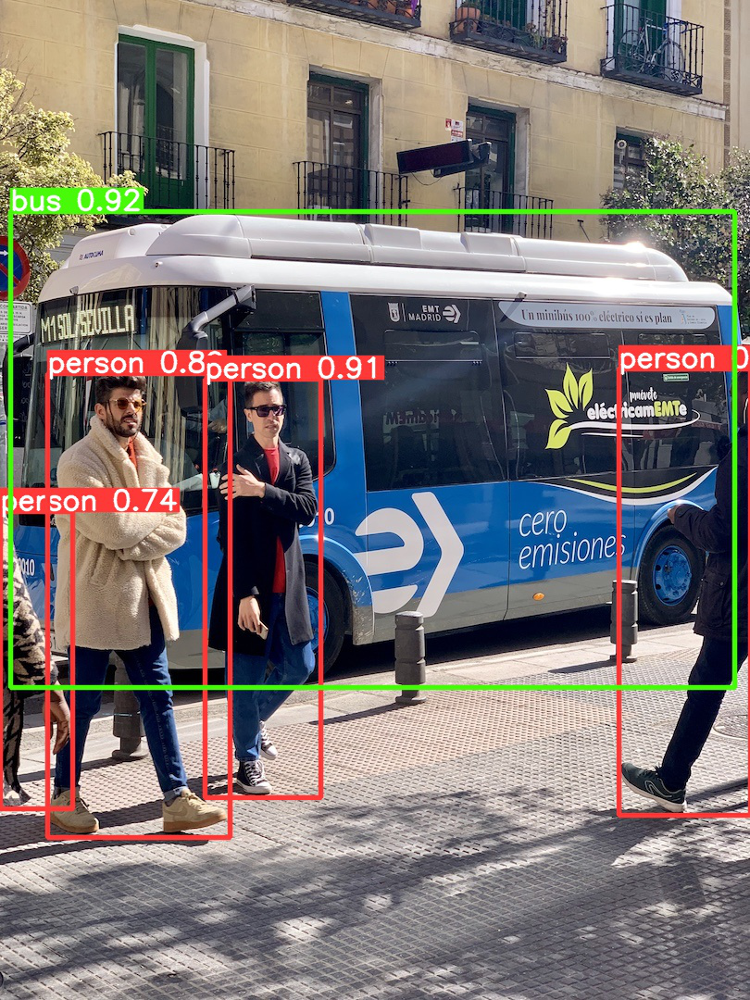

In [ ]:
from PIL import Image

image = Image.open('/content/yolov5/runs/detect/exp/bus.jpg')
image.show()

In [ ]:
!python detect.py --weights yolov5m.pt --img 640 --source data/images/bus3.jpeg

detect: weights=['yolov5m.pt'], source=data/images/bus3.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-175-g5f11555 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5m summary: 290 layers, 21172173 parameters, 0 gradients
image 1/1 /content/yolov5/data/images/bus3.jpeg: 448x640 10 persons, 5 cars, 1 bus, 1 truck, 1 backpack, 1 handbag, 48.6ms
Speed: 0.6ms pre-process, 48.6ms inference, 101.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3


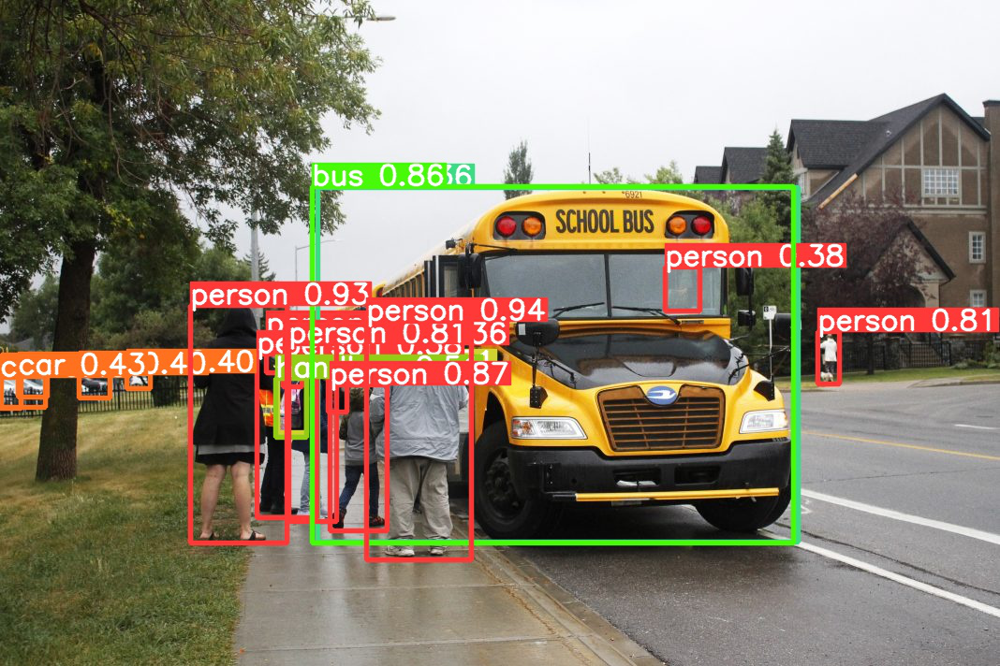

In [ ]:
image = Image.open('/content/yolov5/runs/detect/exp3/bus3.jpeg')
image.show()

## For flower training we used predefined and labeled dataset from roboflow

In [ ]:
%cd ../
!curl -L "https://app.roboflow.com/ds/vL64WffKi7?key=milGGTYn83" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   2925      0 --:--:-- --:--:-- --:--:--  2925
100 10.7M  100 10.7M    0     0  7292k      0  0:00:01  0:00:01 --:--:-- 20.0M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/images/
 extracting: test/images/camellia2_jpg.rf.a4962fac796c8a2683fb5d12d684b99c.jpg  
 extracting: test/images/camellia3_jpg.rf.602ef6c19c5f5df60b178c797d3ac898.jpg  
 extracting: test/images/clavillia1_jpg.rf.e8c9efbab3a2d175494d27089a4f58f2.jpg  
 extracting: test/images/heliconiarostrata1_jpg.rf.2f9752adec6efeec97873640bbec40c9.jpg  
 extracting: test/images/heliconiarostrata4_jpg.rf.f37970114ec22c63356a4d48dd25f992.jpg  
 extracting: test/images/toe_jpg.rf.bc71670e1ba6e0a982292ccb22a0e9e4.jpg  
 extracting: 

In [ ]:
# Train YOLOv5s on custom data for 200 epochs
%cd ./yolov5
!python train.py --img 640 --batch 16 --epochs 200 --data /content/data.yaml --weights yolov5s.pt

/content/yolov5
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5s.pt, cfg=, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https:

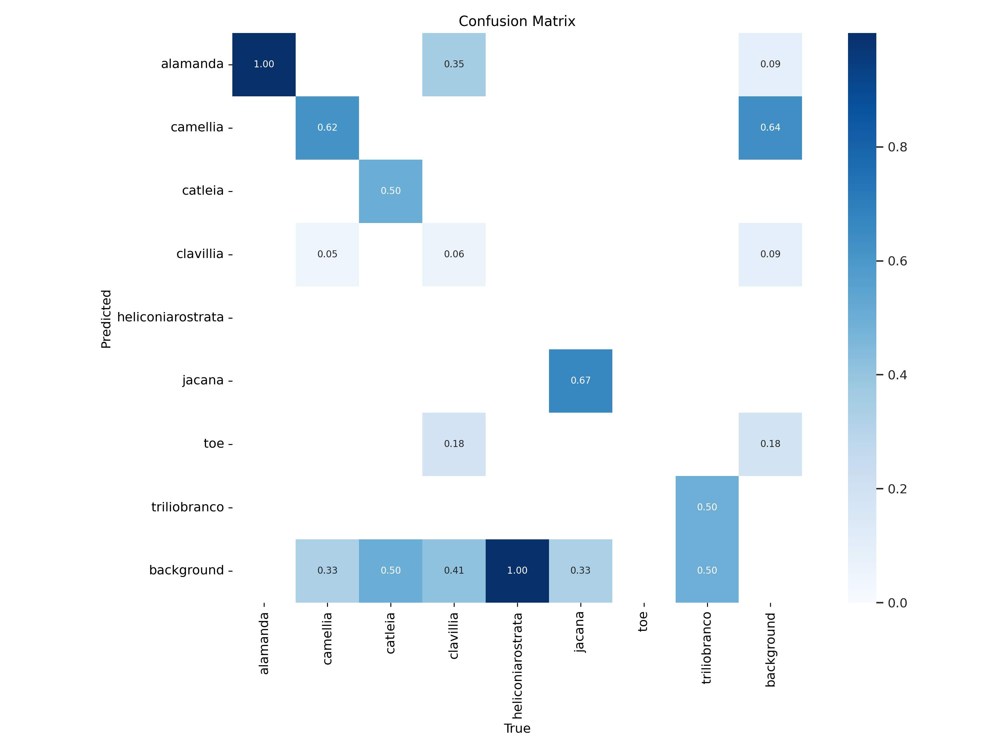

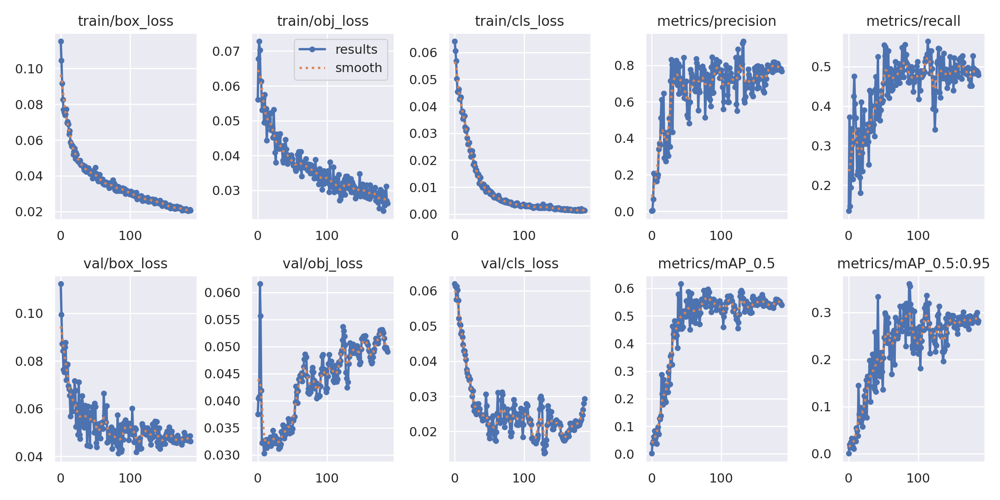

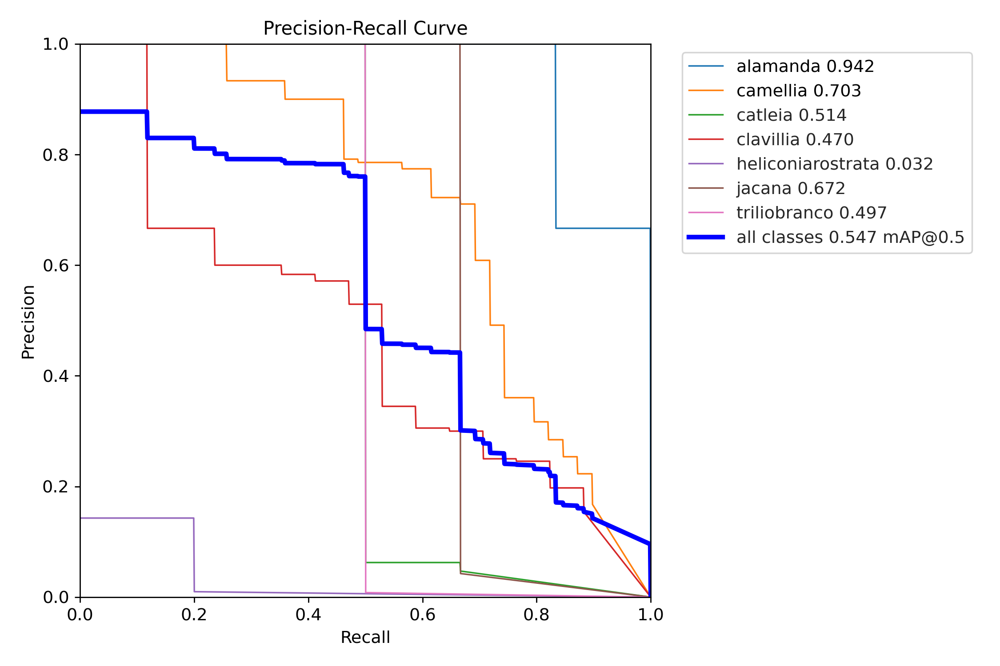

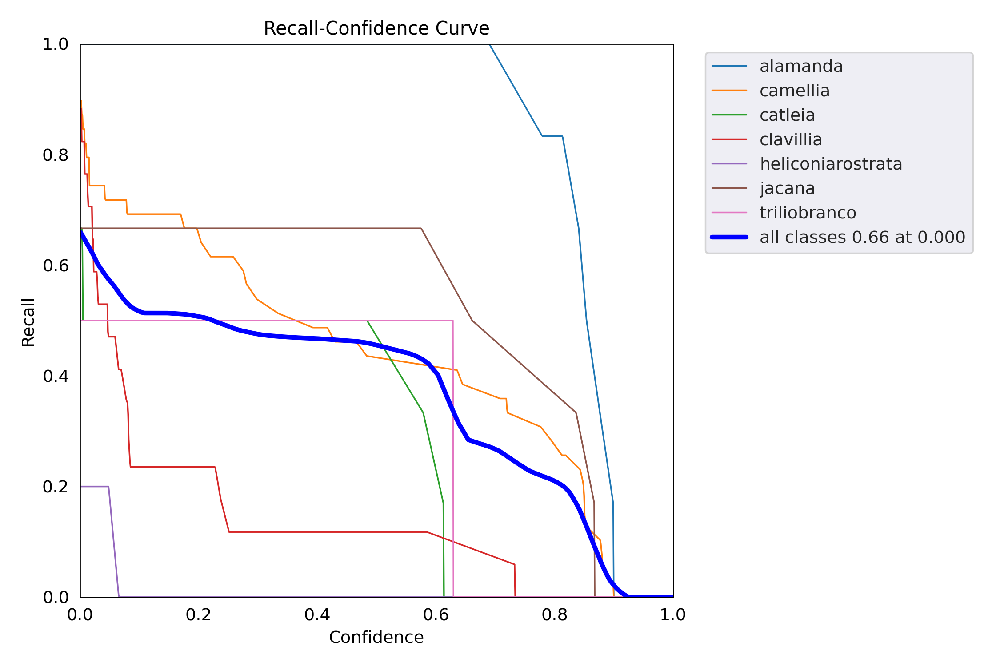

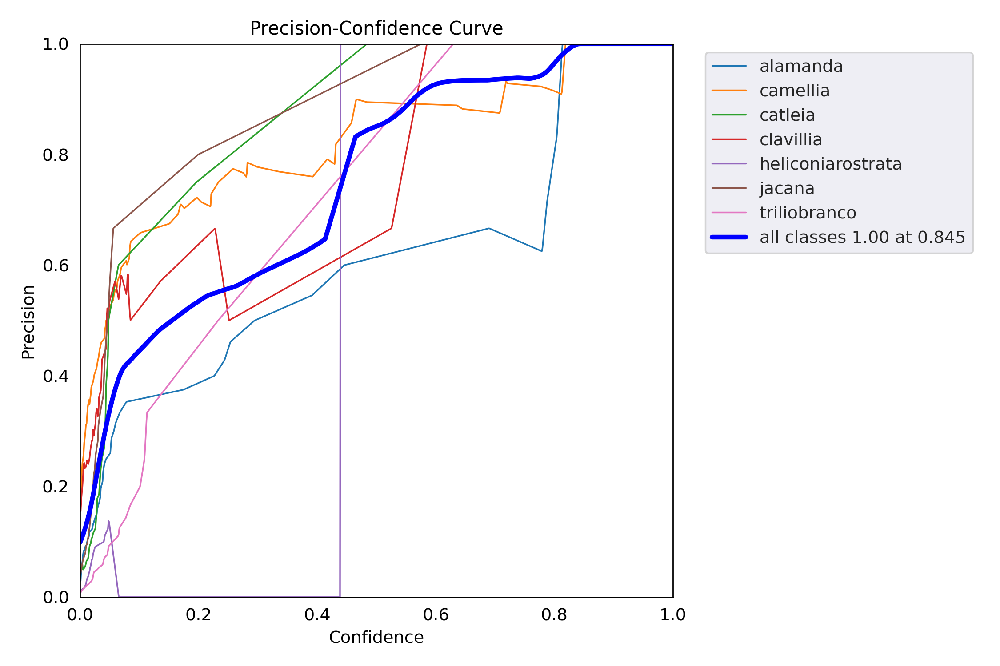

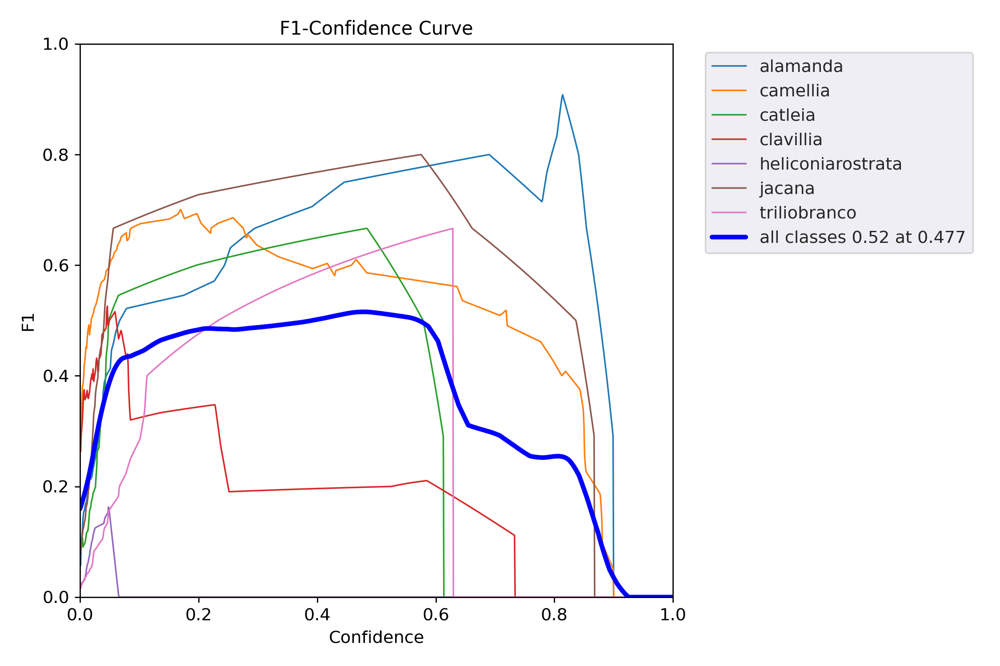

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/train/exp/*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

## We tested on the test set and plotted the resuts

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source /content/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-175-g5f11555 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
image 1/8 /content/test/images/camellia2_jpg.rf.a4962fac796c8a2683fb5d12d684b99c.jpg: 640x640 2 camellias, 11.6ms
image 2/8 /content/test/images/camellia3_jpg.rf.602ef6c19c5f5df60b178c797d3ac898.jpg: 640x640 1 camellia, 11.6ms
image 3/8 /content/test/images/clavillia1_jpg.rf.e8c9efbab3a2d175494d27089a4f58f2.jpg: 640x640 1 clavillia, 11.6ms
imag

In [ ]:
from utils.plots import plot_results
plot_results('/content/yolov5/runs/train/exp/results.csv')

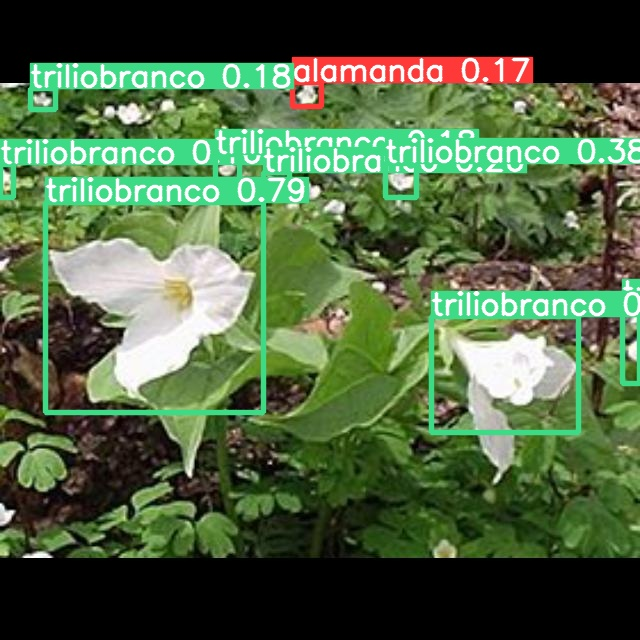

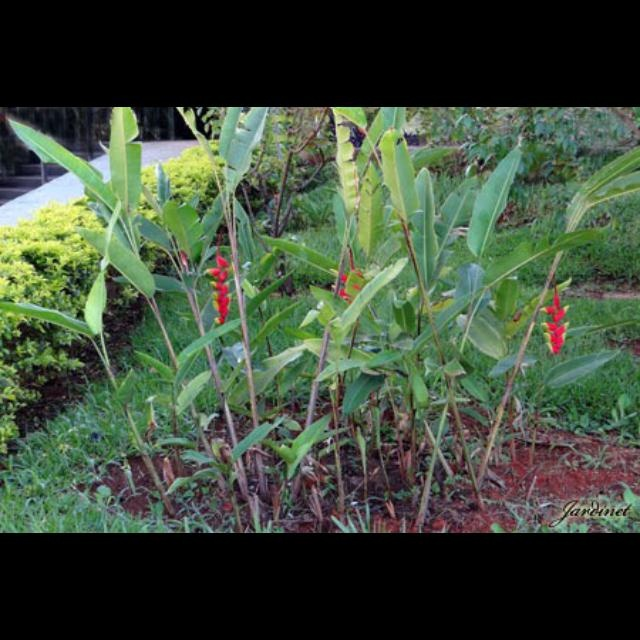

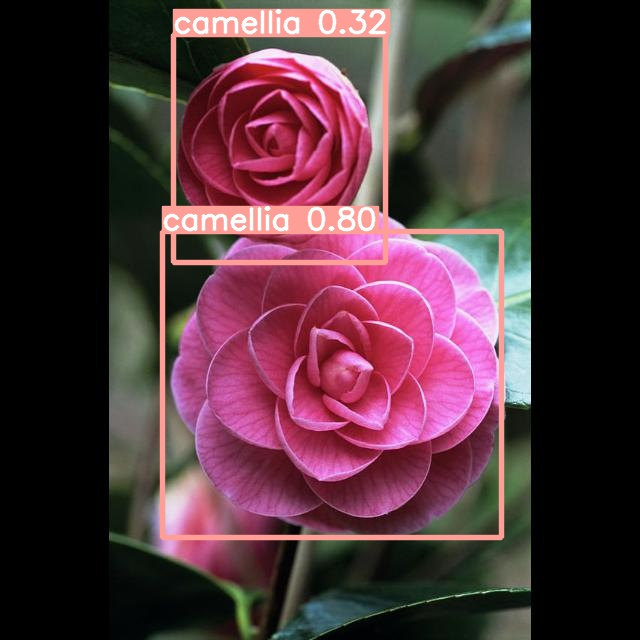

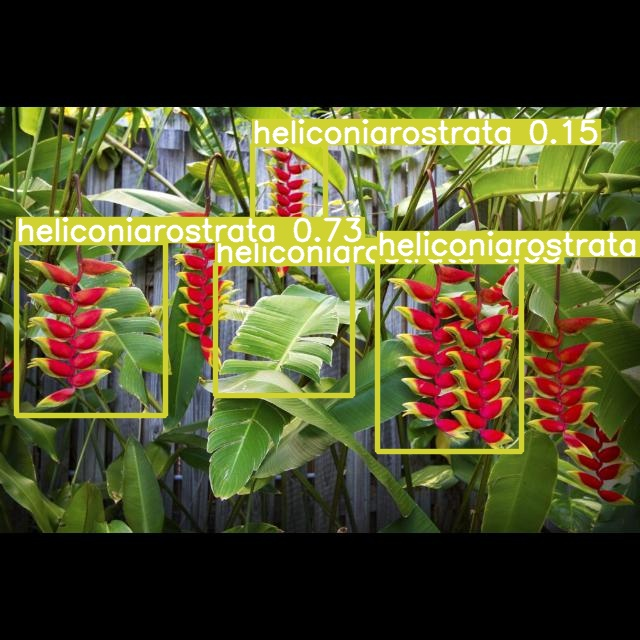

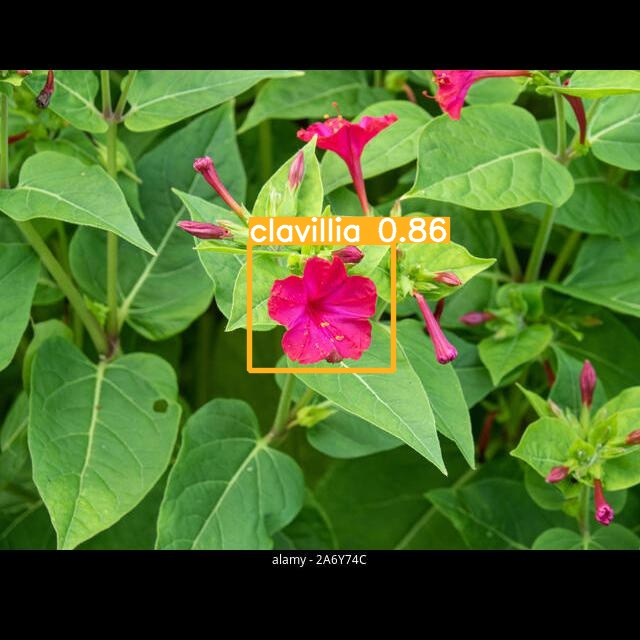

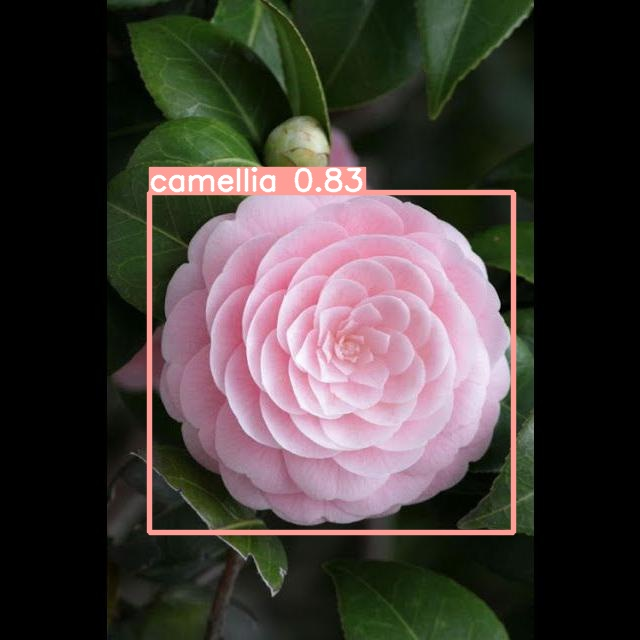

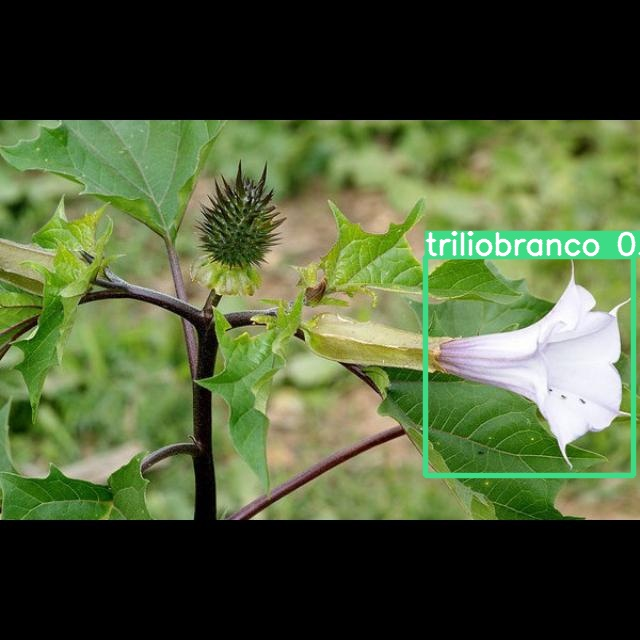

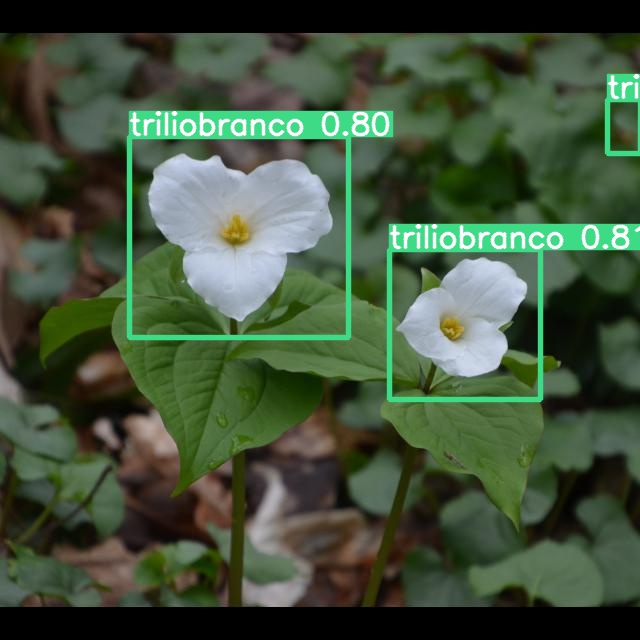

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")